In [1]:
import pandas as pd
import numpy as np
from nltk.tokenize import RegexpTokenizer
import re
from wordcloud import WordCloud
from PIL import Image
import altair as alt
import sys
from pprint import pprint

# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from nltk.stem import WordNetLemmatizer
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel, ldamodel,LdaMulticore,LdaModel
import matplotlib.pyplot as plt
from gensim.test.utils import datapath


from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

import seaborn as sns
import matplotlib.colors as mcolors

# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

from collections import Counter

In [2]:
%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

### Load Tattoo Data for each inmate
Data has already been tokenized in a seperate notebook

In [3]:
tattoos = pd.read_parquet('./data/tattoos.parquet')

In [4]:
tattoos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290608 entries, 0 to 290607
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   DCNumber    290608 non-null  object
 1   Location    290608 non-null  object
 2   text_token  290608 non-null  object
dtypes: object(3)
memory usage: 6.7+ MB


Remove tattoo location from the tattoo text, to normalize the data. Not all tattoos signify the tattoo location.

In [5]:
data_words = tattoos.text_token.values.tolist()
stop_words = ['hand', 'arm', 'forearm', 'chest', 'upper', 'right', 'left', 'and',
              'back', 'leg', 'hand', 'foot', 'right', 'cheek', 'finger', 'neck', 'behind', 'head', 'on', 'ear', 'r', 'l', 'forehead', 'side', 'of', 'face', 'lt', 'rt', 'eye']
data_words[1:8]

[array(['BLACK', 'PANTHER', 'ORIENTAL', 'YING', 'YANG', 'TEXAS', 'W',
        'YELLOW', 'ROSE', 'HEART', 'DEVIL'], dtype=object),
 array(['TRIBAL', 'EAGLE', 'WOMANS', 'FACE', 'RED', 'SCORPIAN', 'DRAGON'],
       dtype=object),
 array(['YOSEMITE', 'SAM', 'ROSE', 'DRAGON', 'LINDA'], dtype=object),
 array(['TIGAR', 'COBRA', 'WIZARD', 'DRAGON', 'HOURGLASS', 'TRIBAL'],
       dtype=object),
 array(['SPIDER', 'HANDS', 'OFF'], dtype=object),
 array(['SNAKE'], dtype=object),
 array(['CROSS', 'MOM'], dtype=object)]

## Building Biagram and Trigram models using Gensim

In [6]:
bigram = gensim.models.Phrases(data_words,min_count=1, threshold=100)
trigram = gensim.models.Phrases(bigram[data_words],threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
def process_words(texts, stop_words=stop_words, allowed_postags=['SYM','NUM','PROPN','NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en_core_web_lg', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

In [ ]:
data_ready = process_words(data_words)

### Create word dictionary

In [ ]:
id2word = corpora.Dictionary(data_ready)

### Create Corpus

In [ ]:
corpus = [id2word.doc2bow(t) for t in data_ready]

### Create multicore LDA model 

In [ ]:
## Set number of topics
num_topics = 5

In [ ]:
lda_model  = LdaMulticore(corpus=corpus,
                        id2word=id2word,
                        num_topics=num_topics, 
                        random_state=100,
                        chunksize=10,
                        passes=15,
                        alpha='symmetric',
                        iterations=100,
                        per_word_topics=True,
                        workers=14,)

In [ ]:
lda_model.save('./data/tattoo_lda_model_5_topics')
lda_model = LdaModel.load('./data/tattoo_lda_model_5_topics')

In [ ]:
pprint(lda_model.print_topics())

[(0,
  '0.068*"skull" + 0.035*"symbol" + 0.033*"boy" + 0.025*"sign" + 0.025*"lady" '
  '+ 0.016*"note" + 0.015*"music" + 0.015*"thug" + 0.014*"sleeve" + '
  '0.012*"female"'),
 (1,
  '0.113*"cross" + 0.036*"clown" + 0.027*"pray" + 0.027*"god" + 0.025*"crown" '
  '+ 0.023*"chinese" + 0.022*"joker" + 0.021*"jesus" + 0.018*"reaper" + '
  '0.015*"tattoo"'),
 (2,
  '0.047*"tribal" + 0.042*"flame" + 0.042*"skull" + 0.030*"gun" + 0.024*"life" '
  '+ 0.023*"dragon" + 0.018*"man" + 0.016*"mask" + 0.016*"demon" + '
  '0.015*"tear"'),
 (3,
  '0.055*"money" + 0.039*"rise" + 0.037*"cross" + 0.036*"love" + 0.034*"rip" + '
  '0.034*"angel" + 0.022*"wing" + 0.021*"skull" + 0.020*"sun" + '
  '0.019*"letter"'),
 (4,
  '0.123*"star" + 0.089*"heart" + 0.029*"dice" + 0.024*"mob" + 0.023*"flower" '
  '+ 0.020*"name" + 0.019*"wrist" + 0.015*"design" + 0.014*"butterfly" + '
  '0.013*"fla"')]


In [ ]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data_ready):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
                # sent_topics_df = pd.concat([sent_topics_df,pd.Series([int(topic_num), round(prop_topic,4), topic_keywords])], ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_ready)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2025411397.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2025411397.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2,0.6455,"tribal, flame, skull, gun, life, dragon, man, mask, demon, tear","[eagle, unicorn, rise, naked, woman, yosemite, sam, taz, devil, rebel]"
1,1,0,0.6545,"skull, symbol, boy, sign, lady, note, music, thug, sleeve, female","[black, panther, oriental, ying, yang, texas, yellow, rise, heart, devil]"
2,2,2,0.6000,"tribal, flame, skull, gun, life, dragon, man, mask, demon, tear","[tribal, eagle, womans, red, scorpian, dragon]"
3,3,2,0.5333,"tribal, flame, skull, gun, life, dragon, man, mask, demon, tear","[yosemite, sam, rise, dragon, linda]"
4,4,2,0.8857,"tribal, flame, skull, gun, life, dragon, man, mask, demon, tear","[tigar, cobra, wizard, dragon, hourglass, tribal]"
5,5,3,0.6000,"money, rise, cross, love, rip, angel, wing, skull, sun, letter",[spider]
6,6,4,0.5979,"star, heart, dice, mob, flower, name, wrist, design, butterfly, fla",[snake]
7,7,1,0.7330,"cross, clown, pray, god, crown, chinese, joker, jesus, reaper, tattoo","[cross, mom]"
8,8,0,0.6271,"skull, symbol, boy, sign, lady, note, music, thug, sleeve, female","[panacea, florida]"
9,9,1,0.7428,"cross, clown, pray, god, crown, chinese, joker, jesus, reaper, tattoo","[renee, dana, eagle, cover, renee, dana]"


In [ ]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100


sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet,
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)],
                                            axis=0)

# Reset Index
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = [
    'Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)


,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0,0.9199,"skull, symbol, boy, sign, lady, note, music, thug, sleeve, female","[tutu, music, note, music, treble, clef, qu, note, note]"
1,1,0.9271,"cross, clown, pray, god, crown, chinese, joker, jesus, reaper, tattoo","[cross, pray, rosary, fidel, lil, only, god, judge, pt, cr]"
2,2,0.9383,"tribal, flame, skull, gun, life, dragon, man, mask, demon, tear","[pot, leaf, st, alein, woman, st, dragon, woman, skull, town, soldier, flame]"
3,3,0.9264,"money, rise, cross, love, rip, angel, wing, skull, sun, letter","[money, bag, skull, flame, money, money, bag, skull, flame, money]"
4,4,0.9000,"star, heart, dice, mob, flower, name, wrist, design, butterfly, fla","[star, outter, wrist, lisa, wrist, flower, vine]"


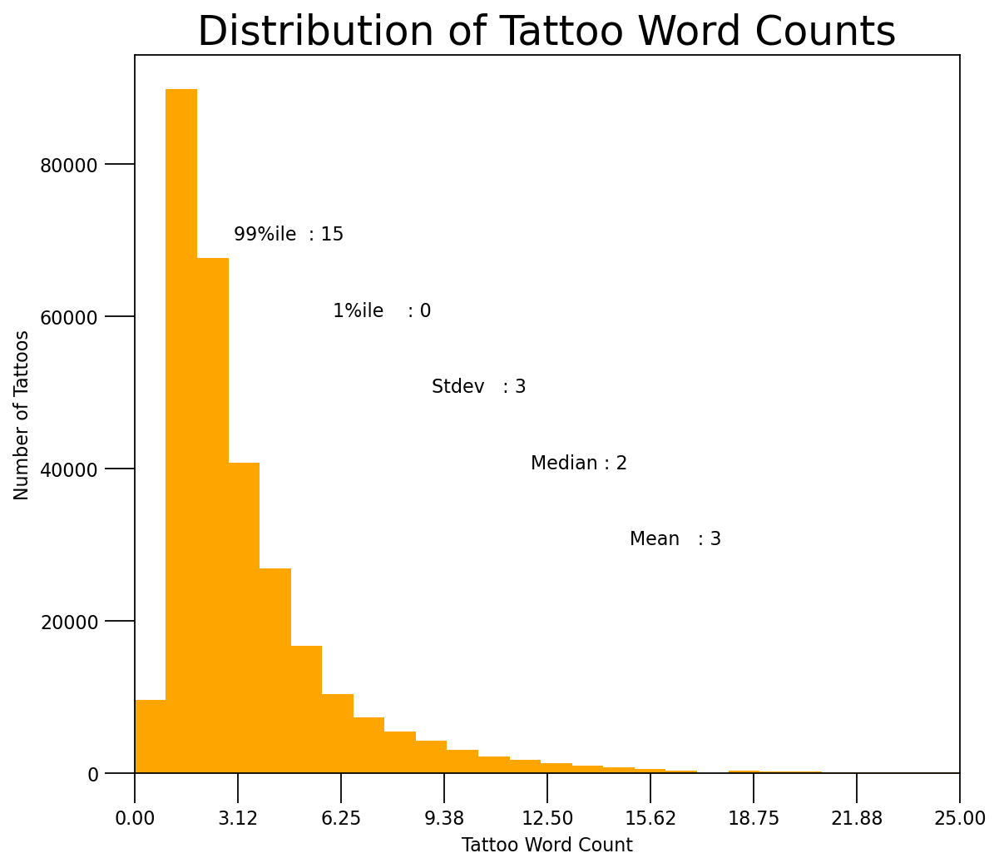

In [ ]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(8, 7), dpi=160)
plt.hist(doc_lens, bins=75, color='orange')
plt.text(15, 30000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(12,  40000, "Median : " + str(round(np.median(doc_lens))))
plt.text(9,  50000, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(6,  60000, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(3,  70000, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 25), ylabel='Number of Tattoos', xlabel='Tattoo Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0, 25, 9))
plt.title('Distribution of Tattoo Word Counts', fontdict=dict(size=22))
plt.show()


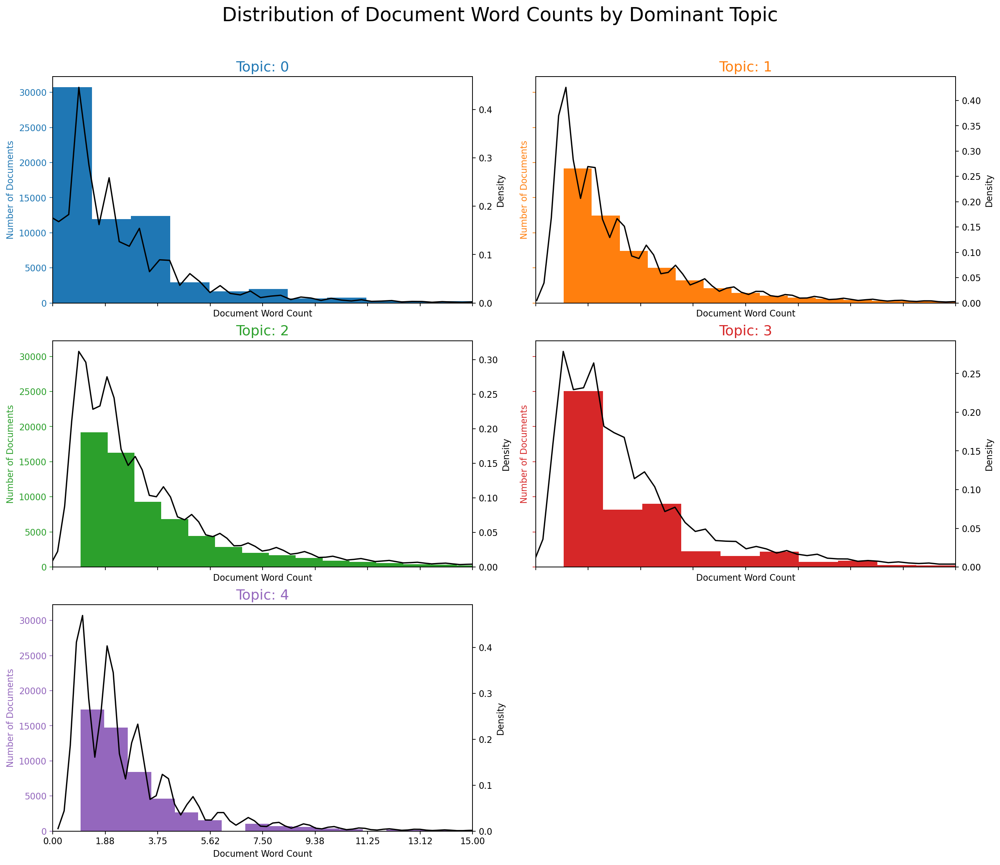

In [ ]:
import seaborn as sns
import matplotlib.colors as mcolors
# more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

fig, axes = plt.subplots(3, 2, figsize=(
    16, 14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    if i < num_topics:
        df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
        doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
        ax.hist(doc_lens, bins=50, color=cols[i])
        ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
        sns.kdeplot(doc_lens, color="black", fill=False, ax=ax.twinx())
        ax.set(xlim=(0, 15), xlabel='Document Word Count')
        ax.set_ylabel('Number of Documents', color=cols[i])
        ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.delaxes(axes[2,1])
fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0, 15, 9))
fig.suptitle(
    'Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()


c:\Python\anaconda3\envs\streamlit\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
c:\Python\anaconda3\envs\streamlit\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
c:\Python\anaconda3\envs\streamlit\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
c:\Python\anaconda3\envs\streamlit\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_s

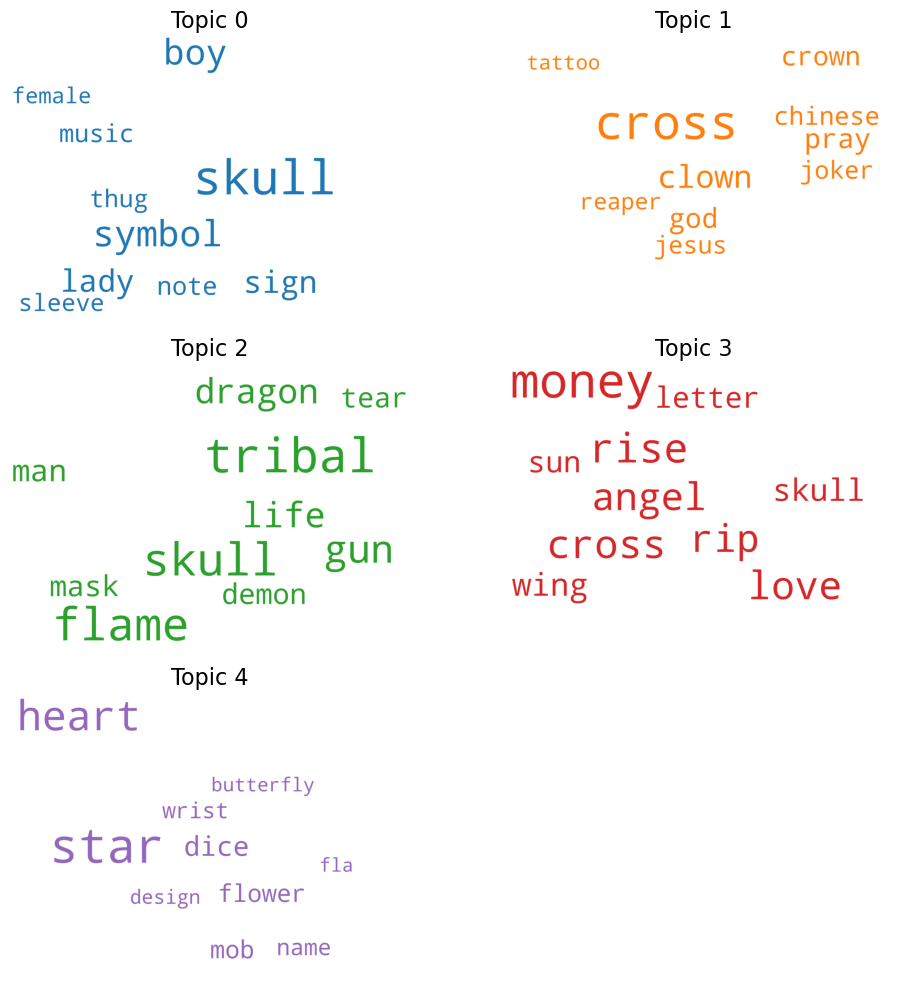

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

# more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=15,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    if i < num_topics:
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

fig.delaxes(axes[2,1])
plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()


C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2935881325.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'],
C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2935881325.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'],
C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2935881325.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'],
C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2935881325.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'],
C:\Users\Travis Weston\AppData\Local\Temp\ipykernel_22552\2935881325.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.l

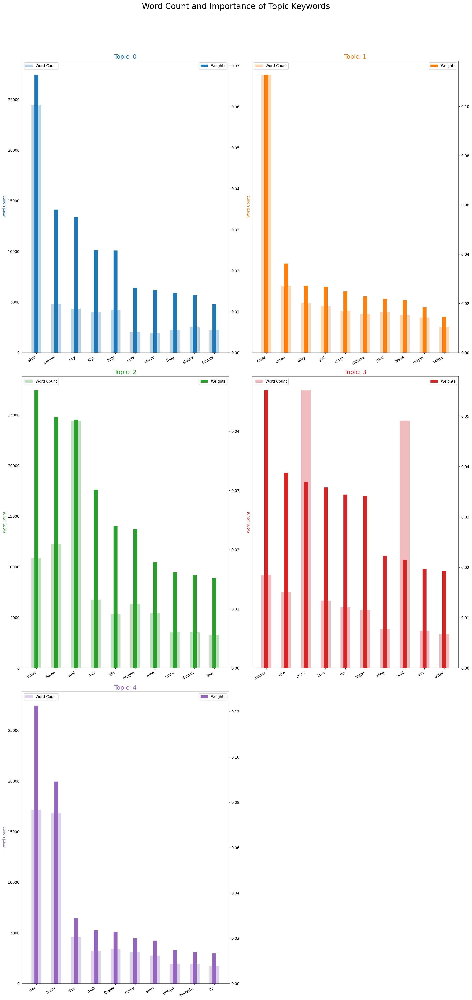

In [ ]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_ready for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i, weight, counter[word]])

df = pd.DataFrame(
    out, columns=['word', 'topic_id', 'importance', 'word_count'])

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(3, 2, figsize=(18, 36), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    if i < num_topics:
        ax.bar(x='word', height="word_count",
            data=df.loc[df.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height="importance",
                    data=df.loc[df.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        # ax_twin.set_ylim(0, 0.450);
        # ax.set_ylim(1000, 5000)
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df.loc[df.topic_id == i, 'word'],
                        rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

fig.delaxes(axes[2,1])
fig.tight_layout(w_pad=2)
fig.suptitle('Word Count and Importance of Topic Keywords',
             fontsize=22, y=1.05)
plt.show()


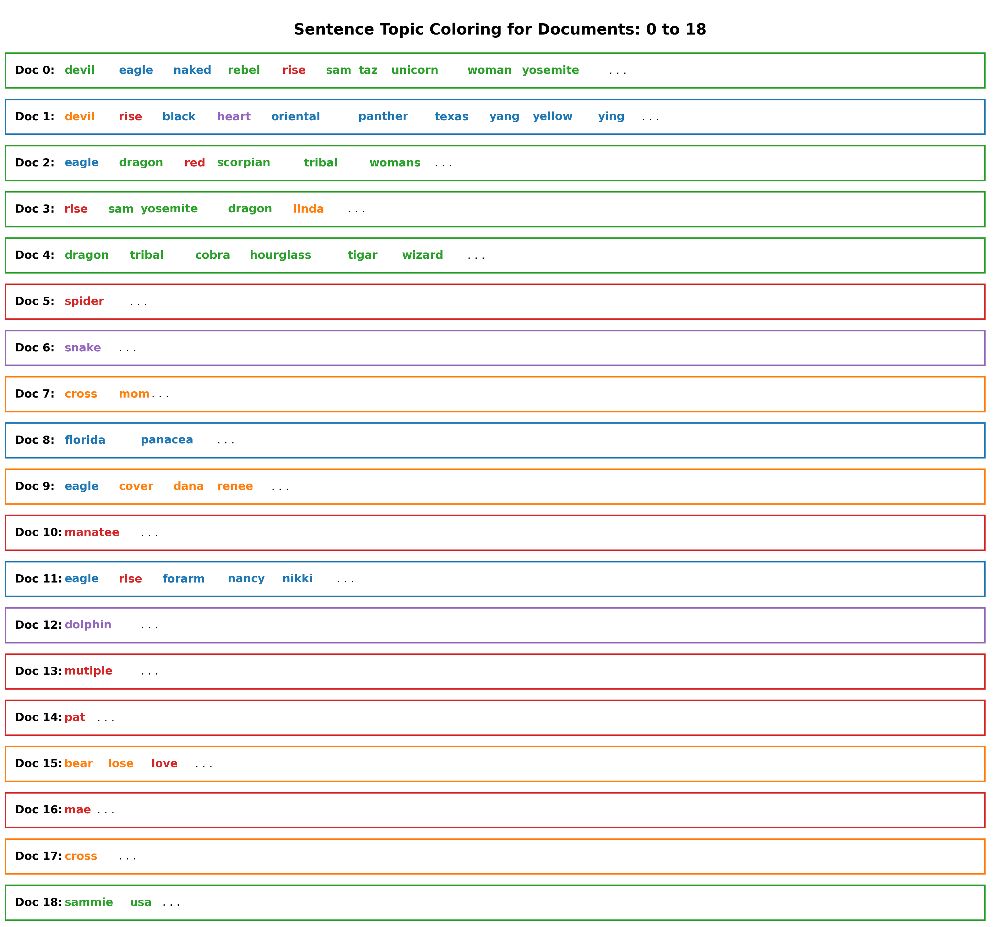

In [ ]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle


def sentences_chart(lda_model=lda_model, corpus=corpus, start=0, end=20):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(
        end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1]
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word.get(wd), topic[0])
                                  for wd, topic in wordid_topics if topic]
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(
                topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1,
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 25:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    # to move the word for the next iter
                    word_pos += .011 * len(word)
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) +
                 ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()


sentences_chart()


In [ ]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)


- The number of documents for each topic by assigning the document to the topic that has the most weight in that document.
- The number of documents for each topic by by summing up the actual weight contribution of each topic to respective documents.

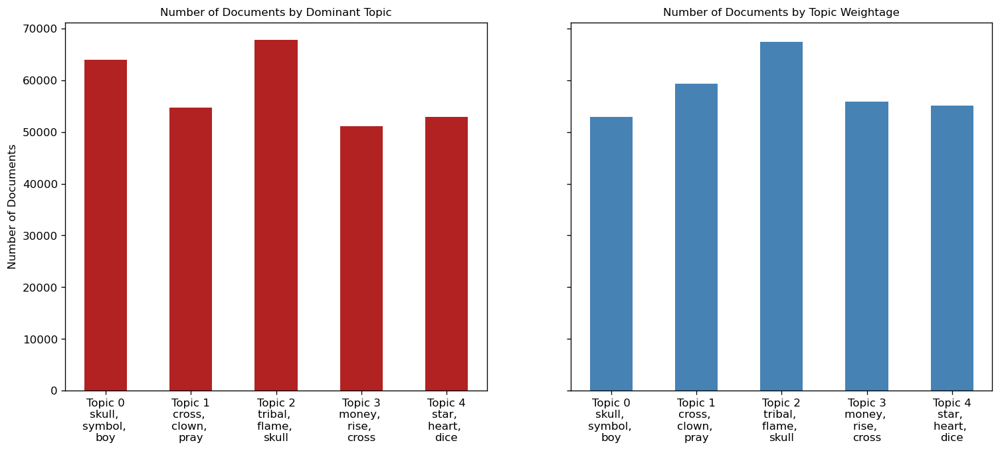

In [ ]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count',
        data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(
    range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(
    x) + '\n' + df_top3words.loc[df_top3words.topic_id == x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
# ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc,
        width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()


In [ ]:
FuncFormatter(lambda x, pos: 'Topic ' + str(
    x) + '\n' + df_top3words.loc[df_top3words.topic_id == x, 'words'].values[0])


In [ ]:
df_top3words

,topic_id,words
0,0,"skull, \nsymbol, \nboy"
1,1,"cross, \nclown, \npray"
2,2,"tribal, \nflame, \nskull"
3,3,"money, \nrise, \ncross"
4,4,"star, \nheart, \ndice"


In [ ]:
df_weight = df_topic_weightage_by_doc.join(df_top3words)


In [ ]:
df_topic_weightage_by_doc


,index,count
0,0,52900.887158
1,1,59341.697462
2,2,67373.959681
3,3,55884.726101
4,4,55104.302895


In [ ]:
df_dominant_topic_in_each_doc


,Dominant_Topic,count
0,0,63968
1,1,54762
2,2,67781
3,3,51153
4,4,52943


In [ ]:
df_count  = df_dominant_topic_in_each_doc.join(df_top3words)
df_count

,Dominant_Topic,count,topic_id,words
0,0,63968,0,"skull, \nsymbol, \nboy"
1,1,54762,1,"cross, \nclown, \npray"
2,2,67781,2,"tribal, \nflame, \nskull"
3,3,51153,3,"money, \nrise, \ncross"
4,4,52943,4,"star, \nheart, \ndice"


In [ ]:
df = df_dominant_topic_in_each_doc.join(df_topic_weightage_by_doc, rsuffix='weighted').join(df_top3words,rsuffix='text')
df[['topic_text', 'top_3']] = [
    (f"Topic {x[1]}", f"{x[6]}") for x in df.itertuples()]
df[['topic_text', 'top_3']]
df

,Dominant_Topic,count,index,countweighted,topic_id,words,topic_text,top_3
0,0,63968,0,52900.887158,0,"skull, \nsymbol, \nboy",Topic 0,"skull, \nsymbol, \nboy"
1,1,54762,1,59341.697462,1,"cross, \nclown, \npray",Topic 1,"cross, \nclown, \npray"
2,2,67781,2,67373.959681,2,"tribal, \nflame, \nskull",Topic 2,"tribal, \nflame, \nskull"
3,3,51153,3,55884.726101,3,"money, \nrise, \ncross",Topic 3,"money, \nrise, \ncross"
4,4,52943,4,55104.302895,4,"star, \nheart, \ndice",Topic 4,"star, \nheart, \ndice"


In [ ]:
import altair as alt

topic_by_count = alt.Chart(df).mark_bar().encode(
    y=alt.Y('topic_id:N', axis=None, title='Topics'),
    x=alt.X('count:Q', title='Number of Tattoos by Dominant Topic',
            sort=alt.SortOrder('descending')),
    color=alt.Color('topic_id:N', legend=None,
                    scale=alt.Scale(scheme='category20c')),
    tooltip=[
        alt.Tooltip('topic_text:N',title='Name'),
        alt.Tooltip('top_3:N', title='Top 3'),
        alt.Tooltip('count:Q', title='Total')
        ]
).properties(
    width=400,
    height=300
)

topic_label = alt.Chart(df).mark_text().encode(
    y=alt.Y('topic_text:N', axis=None),
    text=alt.Text('topic_text:N')
    
).properties(width=40,
             height=300)

topic_by_weight = alt.Chart(df).mark_bar().encode(
    y=alt.Y('topic_id:N', axis = None,title='Topics'),
    x=alt.X('countweighted:Q', title='Number of Tattoos by Topic Weightage'),
    color=alt.Color('topic_id:N', legend=None,
                    scale=alt.Scale(scheme='category20c')),
    tooltip=[
        alt.Tooltip('topic_text:N',title='Name'),
        alt.Tooltip('top_3:N',title='Top 3'),
        alt.Tooltip('countweighted:Q', title='Sum of Weights')
        ]
).properties(
    width=400,
    height=300
)

alt.concat(topic_by_count, topic_label, topic_by_weight, spacing=0)


alt.ConcatChart(...)

In [ ]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1,
                  random_state=0, angle=.99, init='pca', n_jobs=-1)
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()

mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(num_topics),
              width=900, height=700)
plot.scatter(x=tsne_lda[:, 0], y=tsne_lda[:, 1], color=mycolors[topic_num])
show(plot)


c:\Python\anaconda3\envs\streamlit\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 252821 samples in 0.214s...
[t-SNE] Computed neighbors for 252821 samples in 2.718s...
[t-SNE] Computed conditional probabilities for sample 1000 / 252821
[t-SNE] Computed conditional probabilities for sample 2000 / 252821
[t-SNE] Computed conditional probabilities for sample 3000 / 252821
[t-SNE] Computed conditional probabilities for sample 4000 / 252821
[t-SNE] Computed conditional probabilities for sample 5000 / 252821
[t-SNE] Computed conditional probabilities for sample 6000 / 252821
[t-SNE] Computed conditional probabilities for sample 7000 / 252821
[t-SNE] Computed conditional probabilities for sample 8000 / 252821
[t-SNE] Computed conditional probabilities for sample 9000 / 252821
[t-SNE] Computed conditional probabilities for sample 10000 / 252821
[t-SNE] Computed conditional probabilities for sample 11000 / 252821
[t-SNE] Computed conditional probabilities for sample 12000 / 252821
[t-SNE] Computed conditional probabi

c:\Python\anaconda3\envs\streamlit\lib\site-packages\sklearn\manifold\_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 102.788467
[t-SNE] KL divergence after 1000 iterations: 3.299304


c:\Python\anaconda3\envs\streamlit\lib\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


Loading BokehJS ...

c:\Python\anaconda3\envs\streamlit\lib\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


c:\Python\anaconda3\envs\streamlit\lib\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


c:\Python\anaconda3\envs\streamlit\lib\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [ ]:
import pickle
filename = './data/tsne_model.sav'
pickle.dump(tsne_model, open(filename, 'wb'))

tsne_lda.to_parquet('./data/tsne_lda.parquet')


In [ ]:
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import matplotlib.colors as mcolors


def plot_tsne(num_topics=4, colors=mcolors.TABLEAU_COLORS.items()):
    mycolors = np.array([color for name, color in colors])
    plot = figure(title="t-SNE Clustering of {} LDA Topics".format(num_topics),
                width=900, height=700)
    plot.scatter(x=tsne_lda[:, 0], y=tsne_lda[:, 1], color=mycolors[topic_num])
    show(plot)


In [ ]:
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(
    lda_model, corpus, dictionary=lda_model.id2word,mds='mmds',)

pyLDAvis.save_html(vis,'./data/tattoo_pyLDAvis.html')
vis


c:\Python\anaconda3\envs\streamlit\lib\site-packages\pyLDAvis\_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.249780  0.251081       1        1  24.390739
3     -0.033549 -0.349710       2        1  20.223017
1     -0.376406 -0.101682       3        1  20.023726
4     -0.197979  0.349785       4        1  17.791484
0      0.358154 -0.149474       5        1  17.571034, topic_info=        Term          Freq         Total Category  logprob  loglift
52      star  19464.000000  19464.000000  Default  30.0000  30.0000
30     cross  26827.000000  26827.000000  Default  29.0000  29.0000
11     heart  14142.000000  14142.000000  Default  28.0000  28.0000
370    money   9945.000000   9945.000000  Default  27.0000  27.0000
21    tribal  10209.000000  10209.000000  Default  26.0000  26.0000
...      ...           ...           ...      ...      ...      ...
193      two    886.745132    887.520564   Topic5  -5.1741   1.7380
1200    hold    871.791562    872.571471   Topic5  -5.1911   1.7380
1514    full    841.109295    841.881059   Topic5  -5.2270   1.7380
567   dollar    819.978324    820.750780   Topic5  -5.2524   1.7380
138    skull  10625.700702  23632.543694   Topic5  -2.6907   0.9396

[200 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
392       2  0.999801  angel
210       5  0.999426  ankle
1474      1  0.999789   baby
602       2  0.999590    bag
629       1  0.999000   ball
...     ...       ...    ...
8         1  0.779038  woman
8         5  0.220652  woman
254       4  0.998888   word
1270      2  0.999643  world
240       4  0.999741  wrist

[177 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 2, 5, 1])

In [ ]:
topics

[(0,
  [('skull', 0.06783663),
   ('symbol', 0.034919247),
   ('boy', 0.0331667),
   ('sign', 0.025021337),
   ('lady', 0.024938961),
   ('note', 0.015821682),
   ('music', 0.015272947),
   ('thug', 0.014607742),
   ('sleeve', 0.0140873585),
   ('female', 0.011837875)]),
 (1,
  [('cross', 0.112902425),
   ('clown', 0.03622794),
   ('pray', 0.027218146),
   ('god', 0.026846258),
   ('crown', 0.024872664),
   ('chinese', 0.022881187),
   ('joker', 0.021914989),
   ('jesus', 0.021321941),
   ('reaper', 0.018477052),
   ('tattoo', 0.014544979)]),
 (2,
  [('tribal', 0.046953566),
   ('flame', 0.04240939),
   ('skull', 0.041994303),
   ('gun', 0.0301467),
   ('life', 0.023985352),
   ('dragon', 0.023477586),
   ('man', 0.017885555),
   ('mask', 0.016210686),
   ('demon', 0.015734643),
   ('tear', 0.01519851)]),
 (3,
  [('money', 0.055163726),
   ('rise', 0.038804304),
   ('cross', 0.037017327),
   ('love', 0.035859097),
   ('rip', 0.03446124),
   ('angel', 0.03414423),
   ('wing', 0.02232031

In [ ]:
# # Compute Coherence Score
# coherence_model_lda = CoherenceModel(
#     model=lda_model, corpus=corpus, processes=15,dictionary=lda_model.id2word, coherence='c_v',texts=data_ready[:10000])
# coherence_lda = coherence_model_lda.get_coherence()
# print('nCoherence Score: ', coherence_lda)

